# Catering market in Moscow

Tanle of contents:
1. [Data loading](#load_data)
2. [Pre-processing](#preprocess)
* [hours](#hours)
* [rating](#rating)
* [price](#price)
* [seats](#seats)
3. [Analysis](#analyse_data)
* [Number of seats](#seats_analysis)
* [Chain/non-chain places](#chain_analysis)
* [Top 15 chain places](#15_chain)
* [Rating](#rating_analysis)
* [Map](#map)
* [Top 15 streets](#streets_pop)
* [Streets with only 1 establishment](#streets_unpop)
* [Average bill](#avg_bill_analysis)
* [Categories of establishments](#categories)
* [Summary](#analysis_conclusion)
4. [Analysis of the option of opening a cafe](#cafe_analysis)  



<b>Goal:</b> Research catering market in Moscow for the further opening of such establishment.  
Dataset includes a list of places in Moscow available by the summer of 2022. 

## <a id="load_data">Data loading</a>

In [1]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
from plotly import graph_objects as go
import folium
from folium import Map, Choropleth, Marker
from folium.plugins import MarkerCluster
from folium.features import CustomIcon
import warnings
warnings.simplefilter('ignore')

colors = ['#6d9886', '#83aba1', '#9dbdba', '#e1d7b4', '#d7ca96', '#abb6ba', '#828c91', '#5c646b', '#393e46']
plt.rc('font', size=12)
plt.rc('axes', labelsize=14)
plt.rc('xtick', labelsize=12)
plt.rc('ytick', labelsize=12)
plt.rc('legend', fontsize=12)
plt.rc('figure', titlesize=16)

In [ ]:
try:
    places = pd.read_csv('moscow_places.csv')
except:
    places = pd.read_csv('/datasets/moscow_places.csv')

display(places.head(5))
print(places.info())

In [3]:
#types of establishments in the dataset
places['category'].value_counts()

кафе               2378
ресторан           2043
кофейня            1413
бар,паб             765
пиццерия            633
быстрое питание     603
столовая            315
булочная            256
Name: category, dtype: int64

Dataset includes information on 8,406 places, the majority of which are cafes, restaurants, and coffee shops.  
There is some missing data on opening hours, price range, average bill, and number of seats.

## <a id="preprocess">Pre-processing</a>

In [4]:
#number of missing data per column
places.isna().mean()

name                 0.000000
category             0.000000
address              0.000000
district             0.000000
hours                0.063764
lat                  0.000000
lng                  0.000000
rating               0.000000
price                0.605639
avg_bill             0.546039
middle_avg_bill      0.625387
middle_coffee_cup    0.936355
chain                0.000000
seats                0.429574
dtype: float64

<b id="hours">hours</b>

In [ ]:
places[places['hours'].isna()].sample(5)

We can assume that the information on opening hours is missing due to establishment being closed. These places also don't have data on price range, average bill, and number of seats. We cannot provide any logical substitution, the entries (6.37%) should be deleted.

In [ ]:
places = places.drop(places[places['hours'].isna()].index)
places.info()

<b id="rating">rating</b>

In [7]:
#check for anomaly rating values
print(min(places['rating']))
print(max(places['rating']))

1.0
5.0


<b id="price">price</b>

<AxesSubplot:>

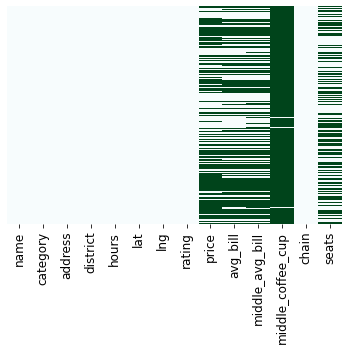

In [8]:
sns.heatmap(places.isna(), yticklabels=False, cbar=False, cmap="BuGn")

It is noticeable that some places don't have information on price category, however the data on average bill is present.

In [ ]:
places[places['price'].isna() & places['avg_bill'].notna()]

In [10]:
def fill_price_category(price_descr):
    """
    Filling n/a in the 'price' column based on information 
    from columns 'avg_bill' or 'middle_avg_bill' or 'middle_coffee_cup'
    :price_descr - str, name of the column
    """
    #extracting unique values either in column 'avg_bill' or 'middle_avg_bill' or 'middle_coffee_cup' 
    for price in places[(places[price_descr].notna()) & 
                        (places['price'].notna())][price_descr].unique():
        #saving the category name for the particular price description in either of three columns
        price_category = places[(places[price_descr] == price) & 
                                (places['price'].notna())]['price'].unique()[0]
        #assigning the category name for the particular price description in case it's missing
        places.loc[places[price_descr] == price, 'price'] = places[
            places[price_descr] == price]['price'].fillna(price_category)


In [11]:
print('Empty values before preprocessing:', places['price'].isna().sum())
price_stats = ['avg_bill', 'middle_avg_bill', 'middle_coffee_cup']
for price_descr in price_stats:
    fill_price_category(price_descr)
    print(f'Empty values after processing of {price_descr} column:', places['price'].isna().sum())

Empty values before preprocessing: 4560
Empty values after processing of avg_bill column: 4037
Empty values after processing of middle_avg_bill column: 4001
Empty values after processing of middle_coffee_cup column: 3937


In [12]:
#Moreover, category within a chain is the same
for name in places[(places['chain'] == 1) & (places['price'].notna())]['name'].unique():
    price_category = places[(places['name'] == name) & (places['price'].notna())]['price'].unique()[0]
    places.loc[places['name'] == name, 'price'] = places[places['name'] == name]['price'].fillna(price_category)
print('Empty values after processing:', places['price'].isna().sum())

Empty values after processing: 3040


<AxesSubplot:>

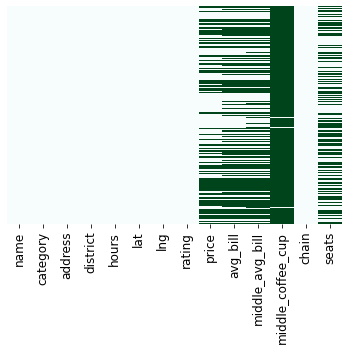

In [13]:
sns.heatmap(places.isna(), yticklabels=False, cbar=False, cmap="BuGn")

In [ ]:
places.info()

In [15]:
#filling the rest of na values in columns 'price' and 'avg_bill' with 'unknown'
places['price'] = places['price'].fillna('unknown')
places['avg_bill'] = places['avg_bill'].fillna('unknown')

In [16]:
#filling the na values in numerical columns 'middle_avg_bill' and 'middle_coffee_cup' with zeros
for col in ['middle_avg_bill', 'middle_coffee_cup']:
    places[col] = places[col].fillna(0)

In [ ]:
#Data type correction
places=places.astype({ "middle_avg_bill": "int", "middle_coffee_cup": "int"})

places.info()

In [18]:
#Check for duplicates
print('Number of duplicates:', places.duplicated().sum())

Number of duplicates: 0


In [19]:
places[['name', 'address']].duplicated().sum()

0

In [ ]:
#Adding another column with the street name only:
places['street'] = places['address'].str.split(", ", n=-1, expand=True)[1]
places.head()

In [ ]:
#Adding another column with indication whether the place is open 24/7:
places['is_24/7'] = places['hours'].str.contains('ежедневно, круглосуточно')
places.sample(5)

<b id="seats">seats</b>

We will fill up the empty values in column 'seats' with the average number of seats based on the street name and place's category.

In [22]:
def fill_seats_area(row, area='street'):
    """
    Filling up values based on the area (street/district) and category
    :row - dataframe
    :area - str, 'street' by default
    return: int, average number of seats
    """
    if pd.isna(row['seats']):
        for unique_area in places[area].unique():
            if row[area] == unique_area:
                for category in places['category'].unique():
                    if row['category'] == category:
                        seats_mean = places[(places['seats'].notna()) & 
                                            (places[area]==unique_area) & 
                                            (places['category']==category)]['seats'].mean()
                        return seats_mean
    else:
        return row['seats']

In [23]:
print('Number of n/a before processing:', places['seats'].isna().sum())
#filling values based on the street and category
places['seats'] = places.apply(lambda row: fill_seats_area(row, 'street'), axis=1)
 
print('Number of n/a after processing:', places['seats'].isna().sum())

Number of n/a before processing: 3375
Number of n/a after processing: 1806


We have processed almost half of the empty values. The rest will be filled based on district and category:

In [24]:
places['seats'] = places.apply(lambda row: fill_seats_area(row, 'district'), axis=1)
print('Number of n/a after processing:', places['seats'].isna().sum())

Number of n/a after processing: 0


In [ ]:
places['seats'] = places['seats'].astype('int')
places.info()

Dataset was pre-processed for further analysis. 
- Approximately 6% of data was deleted: the final dataset does not include places without information on working hours.
- Around 20% of empty values an the price category were substituted with logical values based on data from the places with the same average bill.
- 38% of entries with unavailable price category were labelled as 'unknown'.
- Empty values in the columns `middle_avg_bill` and `middle_coffee_cup` were labelled as zeros.
- Datatypes were corrected.
- Checked for duplicates.
- Added a column with a street name.
- Added a column `is_24/7` to inform whether a place is 24/7.
- Empty values in the column 'seats' were pre-processed based on the place category and street or district.  

As a result, we have 7870 places available for the analysis.

## <a id="analyse_data">Analysis</a>

In [26]:
category_count = places['category'].value_counts()

fig = go.Figure(data = [go.Pie(labels=category_count.index, values=category_count.values, marker_colors = colors)])
fig.update_layout(title='Number of places per category',
                 width=500,
                 height=500)
fig.show()

<b id="seats_analysis">Number of seats</b>

Analysing number of seats based on place's category.

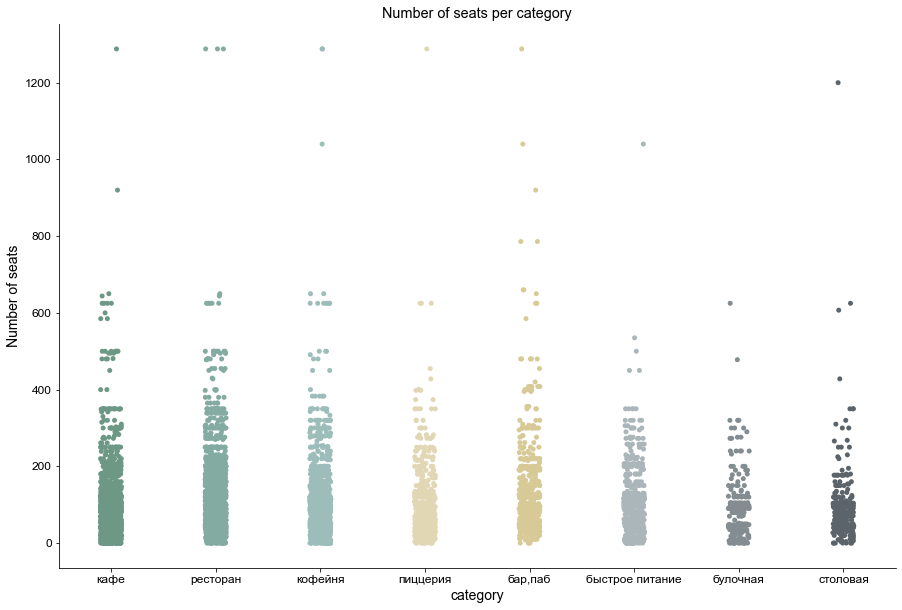

In [27]:
plt.figure(figsize=(15, 10))
sns.stripplot(x='category', y='seats', data=places, palette=colors)
sns.set_style('white')
plt.title('Number of seats per category')
plt.ylabel('Number of seats')
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False);

In the majority of places there are up to 400 seats. Bakeries tend to have up to 100 seats. Every category has outliers.

In [28]:
places[places['category'] == 'кафе']['seats'].max()

1288

In [29]:
places[(places['category'] == 'кафе')&(places['seats']==1288)]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
6807,Loft-cafe академия,кафе,"Москва, проспект Вернадского, 84, стр. 1",Западный административный округ,пн-пт 09:00–20:00; сб 09:00–16:00,55.665142,37.478603,3.6,unknown,unknown,0,0,0,1288,проспект Вернадского,False


To have such a big number of seats in a cafe is very strange. Seems like there was a mistake when entering the data. We should delete outliers and analyse places with number of seats less than 700.

In [30]:
print('Percent of data to be deleted: {:.2%}'.format(len(places[places['seats']>700]) / len(places)))

Percent of data to be deleted: 0.20%


In [ ]:
places_filtered = places.drop(places[places['seats']>700].index)
places_filtered.info()

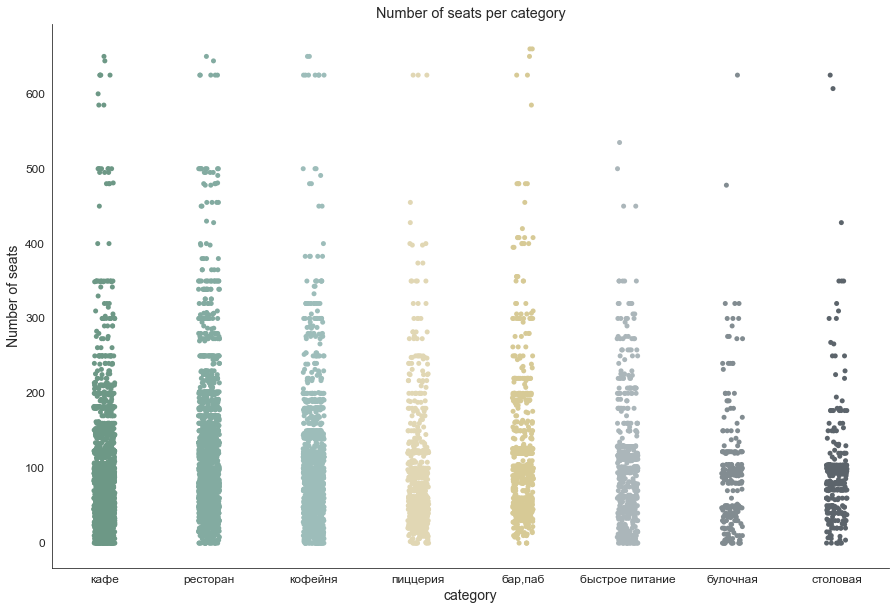

In [32]:
plt.figure(figsize=(15, 10))
sns.stripplot(x='category', y='seats', data=places_filtered, palette=colors)
sns.set_style('white')
plt.title('Number of seats per category')
plt.ylabel('Number of seats')
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False);

<b id="chain_analysis">Chain/non-chain places</b>

In [33]:
print('Number of chain places:',len(places_filtered[places_filtered['chain']==1]))
print('Number of non-chain places:',len(places_filtered[places_filtered['chain']==0]))
print('Ratio of chain places to non-chain:',round(len(places_filtered[places_filtered['chain']==1]) / len(places[places['chain']==0]), 2))

Number of chain places: 3082
Number of non-chain places: 4772
Ratio of chain places to non-chain: 0.64


In [34]:
places_filtered[places_filtered['chain']==0]['category'].value_counts()

кафе               1291
ресторан           1256
кофейня             683
бар,паб             583
быстрое питание     346
пиццерия            298
столовая            220
булочная             95
Name: category, dtype: int64

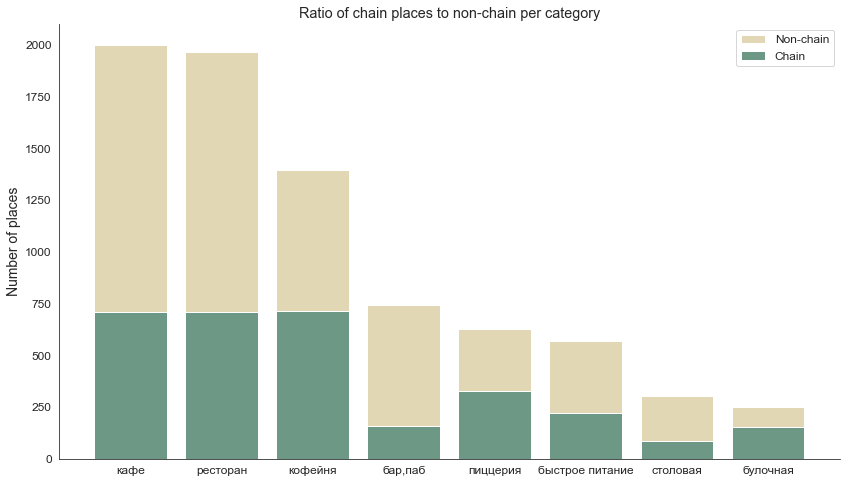

In [35]:
#overall number of places per category
places_category_count = places_filtered['category'].value_counts()
#number of chain places per category
places_chain_count = places_filtered[places_filtered['chain']==1]['category'].value_counts()

plt.figure(figsize=(14, 8))
b1 = plt.bar(places_category_count.index, places_category_count.values, label='Non-chain', color='#e1d7b4')
b2 = plt.bar(places_chain_count.index, places_chain_count.values, label='Chain', color='#6d9886')
plt.title('Ratio of chain places to non-chain per category')
plt.ylabel('Number of places')
plt.legend()
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False);

In [36]:
#unique chains per category
chains = places_filtered[places_filtered['chain']==1]
chains_grouped = chains.groupby('category').agg({'name':'nunique'}).reset_index()
chains_grouped.columns = ['category', '# of chains']
display(chains_grouped.set_index('category').sort_values(by='# of chains', ascending=False))


,# of chains
category,
кафе,333
ресторан,270
кофейня,157
быстрое питание,119
"бар,паб",87
пиццерия,64
столовая,53
булочная,40


The number of nonchain places dominates. In almost all categories they make up approximately 50% of the total number of establishments, with the least percentage of chain places being among the canteens and the most among bakeries. The largest number of chains is among cafes and restaurants. 

<b id="15_chain">Top 15 chain places</b>

In [37]:
# Top 15 chains with the most number of places
сhains_name_grouped = chains.groupby('name')['address'].count().sort_values(ascending=False).reset_index()
сhains_name_grouped.columns = ['chain_name', 'count']
top_15 = сhains_name_grouped.head(15)
top_15

,chain_name,count
0,Шоколадница,119
1,Домино'с Пицца,76
2,Додо Пицца,74
3,One Price Coffee,70
4,Яндекс Лавка,67
5,Cofix,65
6,Prime,50
7,КОФЕПОРТ,42
8,Хинкальная,39
9,Кулинарная лавка братьев Караваевых,39


In [38]:
def create_barplot(df, x, y, title, x_label, y_label):
    fig = px.bar(df.sort_values(by=x, ascending=True),
             x=x,
             y=y,
             text=x,
             color_discrete_sequence=colors
            )

    fig.update_layout(title=title,
                       xaxis_title=x_label,
                       yaxis_title=y_label)
    fig.show()

In [39]:
create_barplot(top_15, 'count', 'chain_name', 
               'Top 15 chains by the number of places', 'Number of places', 'Chain name')

In [40]:
#number of places per category from top 15 chains
top_name_list = top_15['chain_name'].tolist()
top_15_chain_places = places_filtered[places_filtered['name'].isin(top_name_list)]
top_15_chain_places_cnt = top_15_chain_places['category'].value_counts()
top_15_chain_places_cnt

кофейня            334
ресторан           183
пиццерия           151
кафе                90
булочная            24
быстрое питание     10
бар,паб              4
столовая             2
Name: category, dtype: int64

In [41]:
fig = go.Figure(data = [go.Pie(labels=top_15_chain_places_cnt.index, 
                               values=top_15_chain_places_cnt.values, 
                               marker_colors = colors)])
fig.update_layout(title='Top 15 chains per category',
                 width=500,
                 height=500)
fig.show()

More than 40% of places from the top 15 chains are cafes.

In [42]:
# Number of places from the top 15 chains per district
top_15_chain_places_distr = top_15_chain_places['district'].value_counts()
top_15_chain_places_distr

Центральный административный округ         214
Южный административный округ                88
Северный административный округ             86
Северо-Восточный административный округ     83
Западный административный округ             83
Восточный административный округ            77
Юго-Западный административный округ         69
Юго-Восточный административный округ        53
Северо-Западный административный округ      45
Name: district, dtype: int64

In [43]:
def create_pivot_viz(df, agg, title):
    pivot_table = pd.pivot_table(df, index='district', 
                                 columns = 'category', aggfunc=agg)
    pivot_table.columns = pivot_table.columns.droplevel()
    pivot_table = pivot_table.fillna(0)

    plt.figure(figsize=(10, 8))
    sns.heatmap(pivot_table, cmap='BuGn', annot=True)
    plt.title(title)
    plt.ylabel('District')
    plt.xlabel('Category');

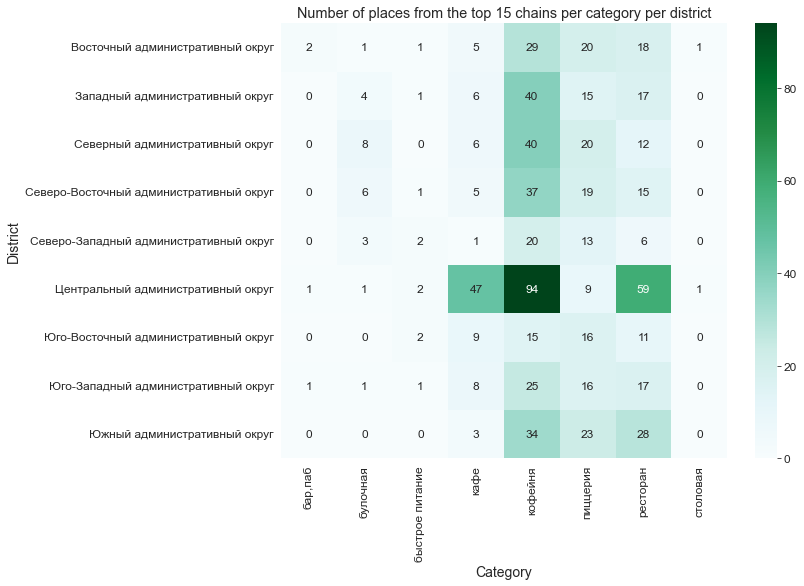

In [44]:
#Number of place from the top 15 chains per place category per district
top_15_chain_places_pivot = pd.pivot_table(top_15_chain_places, index='district', 
                                           columns = 'category', aggfunc={'address': 'count'})
top_15_chain_places_pivot.columns = top_15_chain_places_pivot.columns.droplevel()
top_15_chain_places_pivot = top_15_chain_places_pivot.fillna(0)

#visualizing pivot table
plt.figure(figsize=(10, 8))
sns.heatmap(top_15_chain_places_pivot, cmap='BuGn', annot=True)
plt.title('Number of places from the top 15 chains per category per district')
plt.ylabel('District')
plt.xlabel('Category');

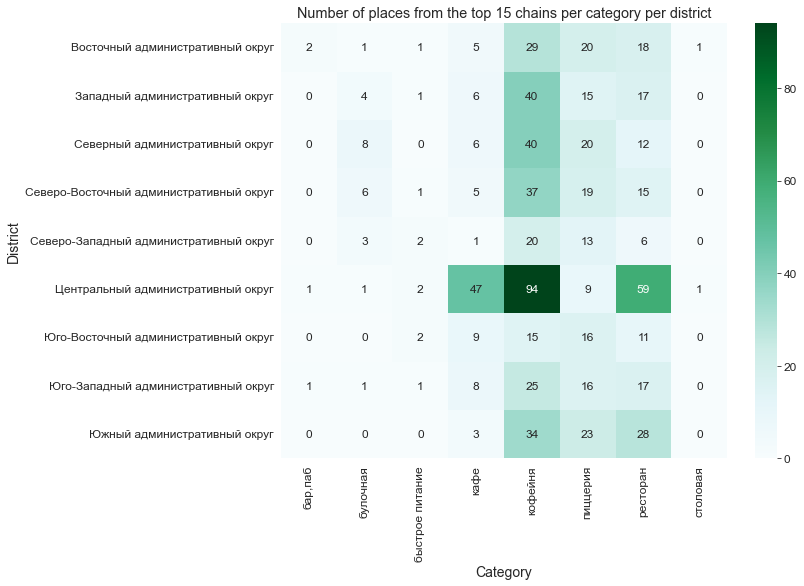

In [45]:
create_pivot_viz(top_15_chain_places, {'address': 'count'}, 
                 'Number of places from the top 15 chains per category per district')

Places that are part of the top 15 chains are not present in every district. The majority of such chain places, especially cafes and restaurants, are located in the central district.

In [46]:
def create_category_barplot(df, x, y, title, x_title, y_title):
    fig = px.bar(df, x=x, y=y, 
             color='category',
             color_discrete_sequence=colors, 
             width=1000,
             height=1200)

    fig.update_layout(
        title=title,
        xaxis_title=x_title,
        yaxis_title=y_title,
        xaxis=dict(
            tickmode='array',
            tickvals=df[x],
            ticktext=df[x]
        ),
        legend_title=''
    )
    fig.show()

In [47]:
# Distribution of places (chain and nonchain) per categories per district
places_district = places_filtered.groupby(['district', 'category'])['name'].agg('count')\
                                       .reset_index()\
                                       .sort_values(by='name', ascending=False)

create_category_barplot(places_district, 'district', 'name', 
                        'Number of all places of every category per district', 'District', 'Amount')

All 9 districts are present. As expected, the majority of places are located in the Central district, particularly restaurants, cafes, and bars. Almost in every district, except for Northwestern district, the category cafe is the leader.

<b id="rating_analysis">Rating</b>

In [48]:
category_rating = places_filtered.groupby('category')['rating'].mean().round(2).sort_values(ascending=False).reset_index()
category_rating

,category,rating
0,"бар,паб",4.39
1,пиццерия,4.30
2,ресторан,4.30
3,булочная,4.28
4,кофейня,4.28
5,столовая,4.22
6,кафе,4.15
7,быстрое питание,4.06


In [49]:
create_barplot(category_rating, 'rating', 'category', 
               'Average rating per category', 'Average rating', 'Category')

The average rating for every category doesn't  go below 4, but doesn't rise above 4.5 either. The low rating is observed among fast food establishments and the highest among bars.

<b id='map'>Map</b>

In [50]:
rating_district = places_filtered.groupby('district')['rating'].mean().round(2).reset_index()
rating_district

,district,rating
0,Восточный административный округ,4.19
1,Западный административный округ,4.19
2,Северный административный округ,4.25
3,Северо-Восточный административный округ,4.16
4,Северо-Западный административный округ,4.24
5,Центральный административный округ,4.38
6,Юго-Восточный административный округ,4.12
7,Юго-Западный административный округ,4.19
8,Южный административный округ,4.19


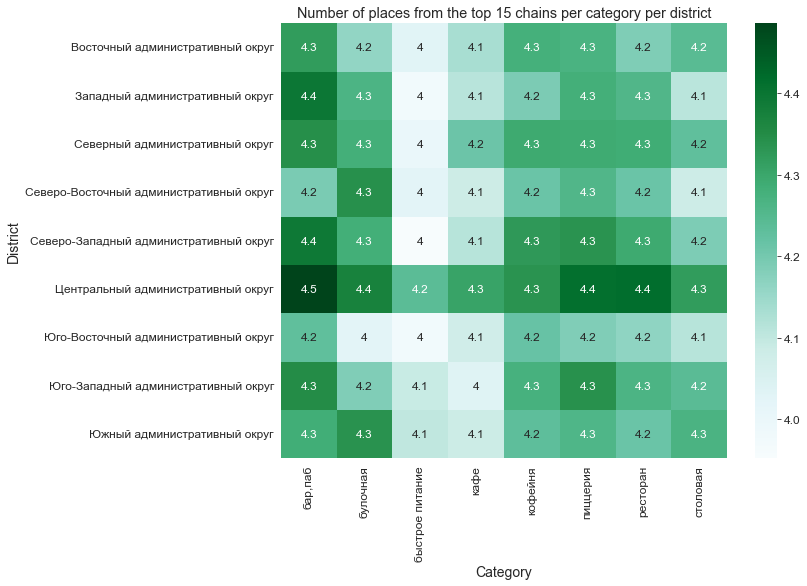

In [51]:
create_pivot_viz(places_filtered, {'rating': 'mean'}, 
                 'Number of places from the top 15 chains per category per district')

The highest average rating is among bars, especially in the Central district, and the smallest among fast food establishments (regardless of the district). The lowest ratings prevail in the Sotheastern and Northeastern districts.

Let's visualise ratings on a map:

In [52]:
# loading JSON file with the district's borders
state_geo = 'admin_level_geomap.geojson'
moscow_lat, moscow_lng = 55.751244, 37.618423

def create_choropleth(df, feature, legend_name):
    # creating city's map
    m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
    # creating choropleth and adding onto the map
    Choropleth(
        geo_data=state_geo,
        data=df,
        columns=['district', feature],
        key_on='feature.name',
        fill_color='YlGn',
        fill_opacity=0.8,
        legend_name=legend_name,
    ).add_to(m)
    return m

In [53]:
m_rating = create_choropleth(rating_district, 'rating', 'Average ratings per district')
m_rating

Visualising all places on a map:

In [54]:
#creating and adding a cluster object to the map
marker_cluster = MarkerCluster().add_to(m_rating)

def create_clusters(row):
    # creating a custom icon object sized 30x30
    icon_url = 'https://img.icons8.com/metro/512/meal.png'
    icon = CustomIcon(icon_url, icon_size=(30, 30))
    
    # creating a marker with our custom icon and adding it to the cluster 
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
        icon=icon
    ).add_to(marker_cluster)

In [55]:
places_filtered.apply(create_clusters, axis=1)
m_rating

<b id='streets_pop'>Top 15 streets</b>

In [56]:
# Top 15 streets by the number of places on them
top15_streets = places_filtered.groupby('street')['name'].count().sort_values(ascending=False).reset_index().head(15)
top_streets_list = top15_streets['street'].tolist()
#places located on those streets
top15_streets_places = places_filtered[places_filtered['street'].isin(top_streets_list)]

In [58]:
# number and percentage of places per category per street (from the list of top 15 streets)
df_new = top15_streets_places.groupby(['street', 'category']).agg({'name': 'count'})
df_new['percentage'] = df_new.groupby(level=0).apply(lambda x: 100 * x / float(x.sum()))
df_new = df_new.reset_index()

create_category_barplot(df_new, 'street', 'percentage', 
                        'Categories by street', 'Top 15 streets', 'Number of places, %')

The list of top 15 streets by the amount of places, of course, included avenues and highways that connect the city center with the outskirts and pass through several districts.

<b id='streets_unpop'>Streets with only one establishment</b>

In [ ]:
#extracting a list with only one place located on them
unpop_streets = places_filtered.groupby('street')['name'].count().sort_values(ascending=True).reset_index()
unpop_streets = unpop_streets[unpop_streets['name']==1]
unpop_streets = unpop_streets['street'].tolist()
#dataframe with the places on these streets
unpop_streets_places = places_filtered[places_filtered['street'].isin(unpop_streets)]
unpop_streets_places

In [60]:
#Categories of those places
unpop_streets_places_cat = unpop_streets_places['category'].value_counts().reset_index()
fig = go.Figure(data = [go.Pie(labels=unpop_streets_places_cat['index'], values=unpop_streets_places_cat['category'], marker_colors = colors)])
fig.update_layout(title='Categories of places located on the unpopular streets',
                 width=500,
                 height=500)
fig.show()

In [61]:
# In which districts are such streets located
unpop_streets_places_dist = unpop_streets_places['district'].value_counts().reset_index()
fig = px.bar(unpop_streets_places_dist,
             x='index',
             y='district',
             color_discrete_sequence = colors
            )
fig.update_layout(
    title='Districts by the number of streets with the only place',
    xaxis_title="District",
    yaxis_title="Number of streets"
)
fig.show()

* In total, there are 471 streets with only one establishment. Of which 30% are cafes, 20% - restaurants and 20% - coffee shops. 
* The most of such streets are located in the Central district. Only 17 such streets are located in the South-Western district. 
* In residential areas, residential complexes with the first floor devoted to public catering and shops are increasingly being built. While in the center of Moscow there are mostly small streets with small premises. Also, the cost of rent is a significant factor.

<b id='avg_bill_analysis'>Average bill</b>

In [62]:
# Median middle_avg_bill per district
district_price = places_filtered[places_filtered['middle_avg_bill']>0]\
.groupby('district')['middle_avg_bill']\
.agg('median')\
.sort_values(ascending=False).reset_index()

district_price

,district,middle_avg_bill
0,Западный административный округ,1000.0
1,Центральный административный округ,1000.0
2,Северо-Западный административный округ,700.0
3,Северный административный округ,650.0
4,Юго-Западный административный округ,600.0
5,Восточный административный округ,550.0
6,Северо-Восточный административный округ,500.0
7,Южный административный округ,500.0
8,Юго-Восточный административный округ,450.0


In [63]:
#visualising median of average bill per district on a map
create_choropleth(district_price, 'middle_avg_bill', 'Average bill median per district')

We can notice the separation of the city in half: in the eastern part the median of the average bill is less than in the western. The smallest average bill is observed in the South-Eastern and Southern districts, the largest bill was in the Central and Western districts.

In [64]:
# Median price for a cup of coffee per district
district_price_coffee = places_filtered[places_filtered['middle_coffee_cup']>0]\
.groupby('district')['middle_coffee_cup']\
.agg('median')\
.sort_values(ascending=False)\
.reset_index()

district_price_coffee

,district,middle_coffee_cup
0,Юго-Западный административный округ,197.0
1,Центральный административный округ,190.0
2,Западный административный округ,187.0
3,Северо-Восточный административный округ,162.5
4,Северный административный округ,159.0
5,Северо-Западный административный округ,150.0
6,Южный административный округ,149.5
7,Юго-Восточный административный округ,145.0
8,Восточный административный округ,135.0


In [65]:
create_choropleth(district_price_coffee, 'middle_coffee_cup', 'Median price for a cup of coffee per district')

Situation with a price for a cup of coffee is a little bit different. The highest median price is present in southwestern, central, and western districts, which is might be due to Gorky park. These are followed by northern districts and the lowest price is observed in the eastern part of the city.

<b id="analysis_conclusion">Conclusion</b>

Out of 7,870 establishments, 50% are cafes and restaurants and almost 18 % - coffee houses.
- When analyzing the number of <b>seats</b>, outliers (0.2%) were identified, which were then removed from the dataset. In most places there were up to 200-250 seats. The smallest number of seats were in bakeries and canteens.
- Of the 7,854 establishments, approximately 40% are <b>chain</b> places. This ratio is retained in almost every category, for bars and canteens, the amount of chain places is much less.
    * A list of top 15 chain places was compiled based on the number of establishments, of which 42% were coffee houses, 23% - restaurants and 19% - pizzerias. Chain coffee houses, pizzerias, restaurants and cafes were represented in all 9 districts of Moscow. In the central district there were the largest number of chain establishments.
- More than 2,000 establishments were located in the Central district, the smallest number of catering places were in the North-Western District. In almost every district, except for the north-western, cafes lead in the number of places.
- The average <b>rating</b> of all establishments does not go below 4. The largest average rating was observed in bars, especially in the Central district. The smallest was at the fast food establishments (regardless of the district). The lower ratings prevail in the sotheastern and northeastern districts.
- A list of <b>15 streets</b> was compiled with the largest number of establishments on them, which included the main arteries of the city. As well as a list of 471 streets on which only one place was located. Generally, such streets were located in the city center.
- According to the <b>average bill</b>, one can notice the separation of the city in half: in the eastern part the median of the average bill was less than in the western. The smallest average bill was observed in the South-Eastern and Southern districts, the largest bill was in the Central and Western districts.  
- With the price of a <b>cup of coffee</b>, the situation was a little more diverse. The largest price was in the South-Western, Central, and Western districts (the influence of Gorky Park is noticeable). Next were the northern districts: North-Eastern, Northern, and North-Western. The smallest price for a cup of coffee was observed in the east of Moscow.


## <a id='cafe_analysis'>Analysis of the option of opening a coffee place</a>

In [ ]:
cafes = places_filtered[places_filtered['category']=='кофейня']
print('Total number of coffee shops:', len(cafes))
cafes.sample(5)

In [67]:
cafes_district = cafes.groupby('district')['name'].count().sort_values(ascending=False).reset_index()

create_barplot(cafes_district, 'name', 'district', 
               'Number of coffee places per district', 'Number of places', 'District')

In [68]:
#24/7 coffeeshops
cafes24_7 = cafes[cafes['is_24/7'] == True]
print('Number of 24/7 coffee places:', len(cafes24_7))

Number of 24/7 coffee places: 59


In [69]:
cafes24_7_chain = cafes24_7['chain'].value_counts()

fig = go.Figure(data = [go.Pie(labels=['Chain', 'Non-chain'], 
                               values=cafes24_7_chain.values, 
                               marker_colors = ['#6d9886', '#e1d7b4'])])
fig.update_layout(title='Coffee places that are open 24/7',
                 width=400,
                 height=400)
fig.show()

In [70]:
# Coffeeshops' ratings per district
cafes_rating = cafes.groupby('district')['rating'].mean().round(2).sort_values(ascending=False).reset_index()
cafes_rating

,district,rating
0,Центральный административный округ,4.34
1,Северо-Западный административный округ,4.33
2,Северный административный округ,4.29
3,Восточный административный округ,4.28
4,Юго-Западный административный округ,4.27
5,Южный административный округ,4.23
6,Юго-Восточный административный округ,4.22
7,Северо-Восточный административный округ,4.21
8,Западный административный округ,4.19


In [71]:
create_choropleth(cafes_rating, 'rating', 'Average coffeeshops rating per district')

In [72]:
# Price for a cup of coffee
print('Lowest price for a cappuccino:', cafes[cafes['middle_coffee_cup']>0]['middle_coffee_cup'].min())
print('Highest price for a cappuccino:', cafes[cafes['middle_coffee_cup']>0]['middle_coffee_cup'].max())

Lowest price for a cappuccino: 60
Highest price for a cappuccino: 1568


A price above 1,000 seems like an anomaly.

In [73]:
cafes[cafes['middle_coffee_cup'] > 1000]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
2859,Шоколадница,кофейня,"Москва, Большая Семёновская улица, 27, корп. 1",Восточный административный округ,"ежедневно, 08:00–23:00",55.782268,37.709022,4.2,средние,Цена чашки капучино:230–2907 ₽,0,1568,1,48,Большая Семёновская улица,False


In [ ]:
# let's find other cafes from this chain and see if a price for coffee is different
cafes[cafes['name']=='Шоколадница']

Since a price for a cup of coffee within a chain should be the same, I will fill up the gaps:

In [ ]:
cafes.loc[cafes['name']=='Шоколадница', 'avg_bill'] = 'Цена чашки капучино:239–274 ₽'
cafes.loc[cafes['name']=='Шоколадница', 'middle_coffee_cup'] = 256
cafes[cafes['name']=='Шоколадница']

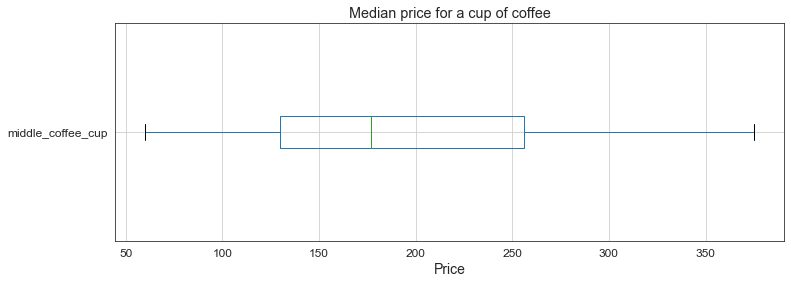

In [76]:
cafes[cafes['middle_coffee_cup']>0].boxplot('middle_coffee_cup', vert=False, figsize=(12, 4))
plt.title('Median price for a cup of coffee')
plt.xlabel('Price')
plt.show()


Checking for correlation between cappuccino price and place's rating:

In [77]:
#relation between rating and price
fig = px.scatter(cafes[(cafes['middle_coffee_cup']>0)&(cafes['rating']>3)],
                 x='rating',
                 y='middle_coffee_cup',
                 color_discrete_sequence=colors
                )

fig.update_layout(title='Correlation between price for a cappuccino and rating',
                   xaxis_title='Rating',
                   yaxis_title='Price for a cappuccino')

fig.show()

Median price for a cup of coffee is 180. The optimal price range for a cup of coffee would be 150-180.

In [78]:
# Median cappuccino price per district
district_price_cafe = cafes[cafes['middle_coffee_cup']>0].groupby('district')['middle_coffee_cup'].agg('median')
district_price_cafe = district_price_cafe.reset_index().sort_values(by='middle_coffee_cup', ascending=False)
district_price_cafe

,district,middle_coffee_cup
1,Западный административный округ,225.0
5,Центральный административный округ,202.5
7,Юго-Западный административный округ,199.5
4,Северо-Западный административный округ,174.0
3,Северо-Восточный административный округ,170.0
8,Южный административный округ,170.0
2,Северный административный округ,162.0
6,Юго-Восточный административный округ,147.5
0,Восточный административный округ,138.0


In total, information about 1,395 coffee houses was available, 30% of which were located in the Central district. 
- 59 coffee houses worked 24/7, of which almost 85% are chain coffee shops. 
- The highest rating was for coffee houses located in Central and North-Western districts (above 4.33). The smallest rating was in the North-Eastern and Western districts (below 4.21). 

The optimal price for a cup of cappuccino should be 150-180, which can be increased in the future, given that the there will also be investments into the product (good bean are bought and baristas are trained). If the price tag is too low, the quality of a product is called into question, if it is too high, we would limit the number of customers.

Opening a coffee shop in the Central district should be avoided because of the renting price. Although theoretically there may be many more visitors in the city centre, the competition is also very high. Perhaps Eastern and Southern districts should be considered because of the low competition.